<a href="https://colab.research.google.com/github/iv53ca/microproject/blob/main/final%20version%20of%20solver%2Bvisualizator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from scipy.integrate import odeint #условный решатель диффуров#
import matplotlib.pyplot as plt 
import matplotlib.cm as cm #встроенные карты цветов#
%matplotlib inline 
#штука чтоб графики были встроены в ноутбук непосредственно под ячейкой кода#
from IPython.display import display, Image #создает JPEG/GIF/PNG из RAW-data
import matplotlib.animation as animation 
figsize = 6
dpi = 600

Функция для вывода графиков xy, xt, yt

In [ ]:
def plot_position(x_1, y_1, x_2, y_2, theta_1, theta_2, t):

    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)

    # xy-plot
    L = 1.1*(l1 + l2)
    ax = plt.subplot(2, 2, (1, 3), autoscale_on=False, xlim=(-L, L), ylim=(-L, L))
    ax.plot(x_1, y_1, label=r"Track $m_1$")
    ax.plot(x_2, y_2, label=r"Track $m_2$")
    ax.plot([0, x_1[0], x_2[0]], [0, y_1[0], y_2[0]], "-o", label="Initial position", c='k')
    plt.ylabel(r"$y$")
    plt.xlabel(r"$x$")
    ax.legend()

    # xt-plot
    ax = plt.subplot(2, 2, 2)
    ax.plot(t, theta_1, label=r"$\theta_1(t)$")
    ax.plot(t, theta_2, label=r"$\theta_2(t)$")
    plt.ylabel(r"$\theta$, [rad]")
    plt.xlabel(r"$t$, [s]")
    ax.legend()
    plt.xlim([0, np.max(t)])

    # yt-plot
    ax = plt.subplot(2, 2, 4)
    ax.plot(t, omega_1, label=r"$\omega_1(t)$")
    ax.plot(t, omega_2, label=r"$\omega_2(t)$")
    plt.ylabel(r"$\omega$, [rad/s]")
    plt.xlabel(r"$t$, [s]")
    plt.xlim([0, np.max(t)])
    ax.legend()

    plt.show()

Функция создания анимации для двойного маятника

In [ ]:
def create_animation(filename, x_1, y_1, x_2, y_2, tmax, l1, l2):
        
    fig = plt.figure(figsize=(4, 4), dpi=60)
    L = 1.1*(l1 + l2)
    ax = fig.add_subplot(111, autoscale_on=False, xlim=(-L, L), ylim=(-L, L))
    a, b = [1, 2]
    tail1, = ax.plot([],[],'r') # (elem,)
    line, = ax.plot([], [], '-o', lw=2, c="k")
    time_template = r'$t = %.1fs$'
    time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)
    ax.set_aspect('equal')
    ax.axis('on')

    FPS = 15
    framesNum = int(FPS*tmax)
    frames = np.floor(np.linspace(0, len(x_1) - 1, framesNum)).astype(np.int)

    def animate(i):
        line.set_data([0, x_1[i], x_2[i]], [0, y_1[i], y_2[i]])
        tail1.set_data(x_2[:i], y_2[:i])
        time_text.set_text(time_template % (i*dt))
        return line, time_text, tail1

    anim = animation.FuncAnimation(fig, animate, frames=frames)

    anim.save(filename + '.gif', writer='pillow', fps=FPS)

    plt.close(anim._fig)

    with open(filename + '.gif','rb') as file:
        display(Image(file.read()))

Функция красивой фазовой диаграммы

In [ ]:
def plot_phasespace(theta_1, omega_1, theta_2, omega_2):
  
    plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
    plt.title(r"Phase-space diagram, $\theta_{10}=%.1f$, $\theta_{20}=%.1f$ "%(theta_1[0], theta_2[0])
             + r"$\omega_{10}=%.1f$, $\omega_{20}=%.1f$"%(omega_1[0], omega_2[0]))
    plt.plot(theta_1, omega_1, label=r"$i=1$")
    plt.plot(theta_2, omega_2, label=r"$i=2$")
    plt.legend()
    plt.xlabel(r"$\theta_i$, [rad]")
    plt.ylabel(r"$\omega_i$, [rad/s]")
    xlim = [np.min(theta_1), np.max(theta_1), np.min(theta_2), np.max(theta_2)]
    plt.xlim(np.min(xlim), np.max(xlim))
    plt.show()

Решение дифференциального уравнения по факту (пишем чему равно маленькое изменение угловой скорости для того, чтоб засунуть в ode)
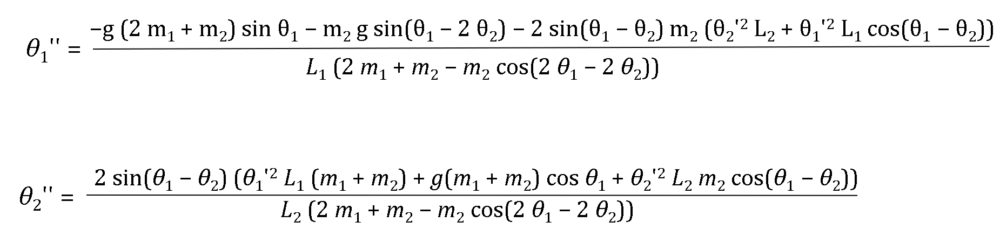

In [ ]:
def RHS(z, t, l1, l2, m1, m2, g):
    theta_1, omega_1, theta_2, omega_2 = z
    d_omega_1 = (-g*(2*m1 + m2)*np.sin(theta_1) - m2*g*np.sin(theta_1 - 2*theta_2) - 2*np.sin(theta_1 - theta_2)*m2*(omega_2**2*l2 + omega_1**2*l1*np.cos(theta_1 - theta_2)))/(l1*(2*m1 + m2 - m2*np.cos(2*theta_1 - 2*theta_2)))
    d_omega_2 = (2*np.sin(theta_1 - theta_2)*(omega_1**2*l1*(m1 + m2) + g*(m1 + m2)*np.cos(theta_1) + omega_2**2*l2*m2*np.cos(theta_1 - theta_2)))/(l2*(2*m1 + m2 - m2*np.cos(2*theta_1 - 2*theta_2)))
    
    return omega_1, d_omega_1, omega_2, d_omega_2

Переводим сферические координаты в декартовы

In [ ]:
def to_cartesian(theta_1, omega_1, theta_2, omega_2, l1, l2):
    x_1 = l1*np.sin(theta_1)
    y_1 = -l1*np.cos(theta_1)
    x_2 = x_1 + l2*np.sin(theta_2)
    y_2 = y_1 - l2*np.cos(theta_2)
    vel_x_1 = omega_1*l1*np.cos(theta_1)
    vel_y_1 = omega_1*l1*np.sin(theta_1)
    vel_x_2 = vel_x_1 + omega_2*l2*np.cos(theta_2)
    vel_y_2 = vel_y_1 + omega_2*l2*np.sin(theta_2)
    
    return x_1, y_1, x_2, y_2, vel_x_1, vel_y_1, vel_x_2, vel_y_2

Начальные условия системы

In [ ]:
l1, l2 = 0.32, 0.32
m1, m2 = 3., 1.

z0 = [-0.56, 0., -0.49, 0.]
tmax, dt = 50, 0.01
t = np.arange(0, tmax+dt, dt)
g = 9.81

Решаем с помощью odeшки диффур



In [ ]:
z = odeint(RHS, z0, t, args=(l1, l2, m1, m2, g))

theta_1, omega_1, theta_2, omega_2 = z[:,0], z[:,1], z[:,2], z[:,3]
x_1, y_1, x_2, y_2, vel_x_1, vel_y_1, vel_x_2, vel_y_2 = to_cartesian(theta_1, omega_1, theta_2, omega_2, l1, l2)

Наконец-то красивый график

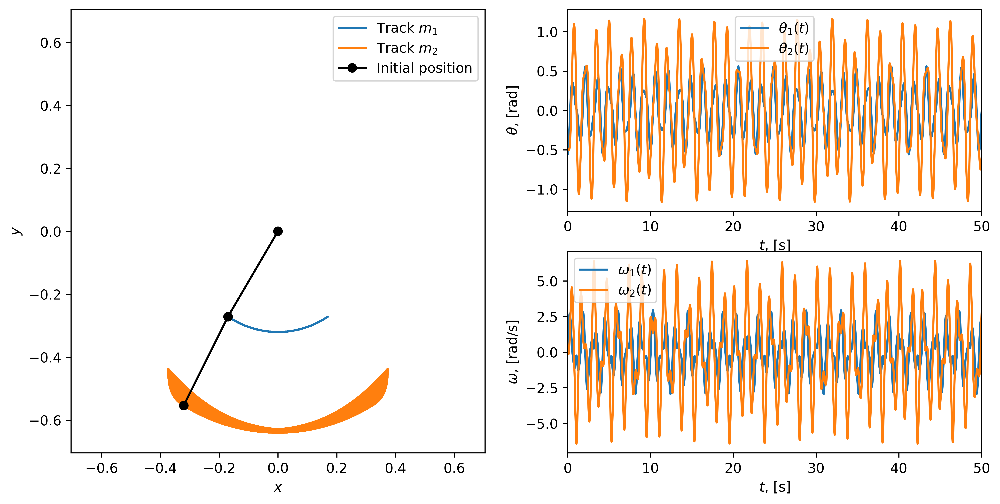

In [ ]:
plot_position(x_1, y_1, x_2, y_2, theta_1, theta_2, t)

Вот анимашка этого графика

<ipython-input-11-51d7ed11aa24>:16: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  frames = np.floor(np.linspace(0, len(x_1) - 1, framesNum)).astype(np.int)


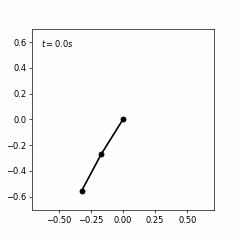

In [ ]:
create_animation("double_pendulum", x_1, y_1, x_2, y_2, tmax, l1, l2)

Построим фазовую диаграмму простого маятника

In [ ]:
def RHS_simple(z, t, L, g):
    theta, w = z
    wdot = -np.sin(theta)*g/L
    return w, wdot

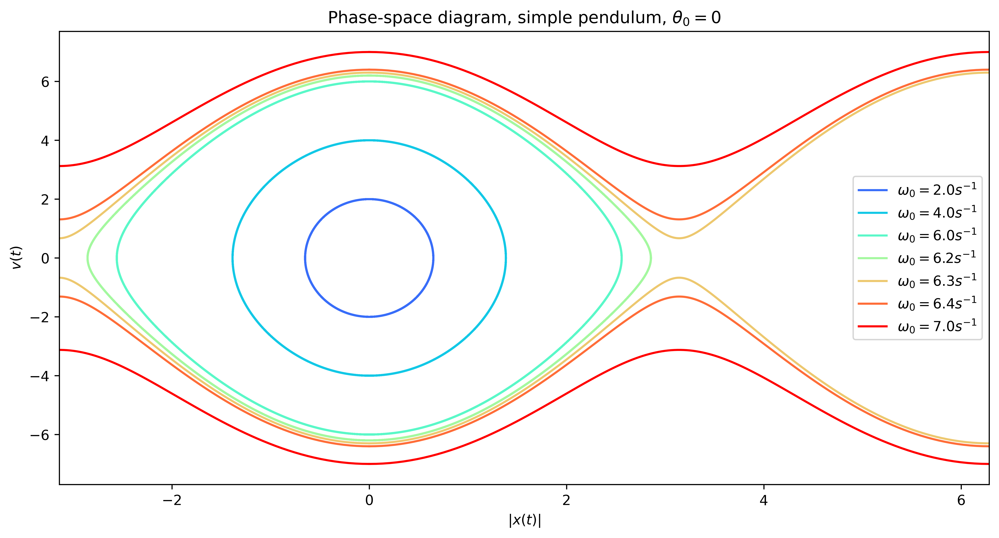

In [ ]:
w0 = [2., 4., 6, 6.2, 6.3, 6.4, 7.]
L = 1.
g = 9.81
tmax_simp, dt_simp = 4, 0.01
t_simp = np.arange(0, tmax+dt, dt)

plt.figure(figsize=(2*figsize, figsize), dpi=dpi)
plt.title(r"Phase-space diagram, simple pendulum, $\theta_0=0$")
for i in range(len(w0)):
    z = odeint(RHS_simple, [0, w0[i]], t_simp, args=(L, g))
    theta_simp, w_simp = z[:,0], z[:,1]
    color = cm.rainbow(float(i + 1)/len(w0)) # Creating colormap
    plt.plot(theta_simp, w_simp, c=color, label=r"$\omega_0=%.1fs^{-1}$"%(w0[i]))
    plt.plot(theta_simp, -w_simp, c=color)
    plt.plot(-theta_simp, w_simp, c=color)
    plt.plot(-theta_simp, -w_simp, c=color)
plt.xlabel(r"$|x(t)|$")
plt.ylabel(r"$v(t)$")
plt.xlim([-np.pi, 2*np.pi])
plt.legend()
plt.show()

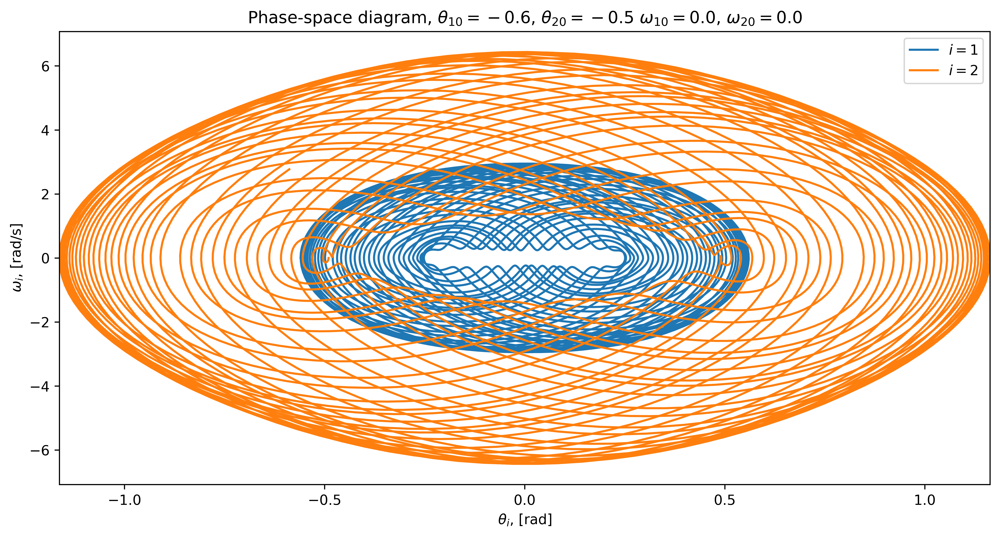

In [ ]:
plot_phasespace(theta_1, omega_1, theta_2, omega_2)

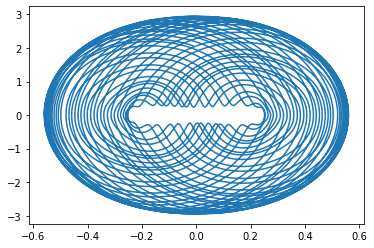

In [ ]:
time = np.empty(len(y_1))
for i in range(len(y_1)):
    time[i] = i*(30/len(y_1))
ax = plt.subplot()
ax.plot(theta_1, omega_1)

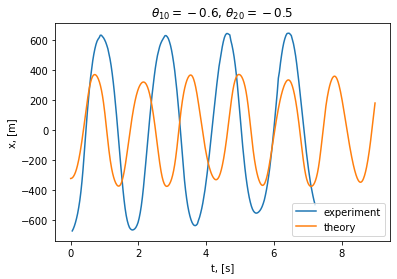

In [ ]:
arrX_upper = np.empty(341)
arrY_upper = np.empty(341)
cnt = 0
with open ('upper_3.txt') as file:
    for line in file:
        X, Y = line.split()
        X = float(X.replace(",", "."))
        Y = float(Y.replace(",", "."))
        arrX_upper[cnt] = X
        arrY_upper[cnt] = Y
        cnt += 1
        
        
arrX_lower = np.empty(249)
arrY_lower = np.empty(249)
cnt = 0
with open ('lower_3.txt') as file:
    for line in file:
        X, Y = line.split()
        #rint(X.replace(",", "."))
        X = float(X.replace(",", "."))
        Y = float(Y.replace(",", "."))
        arrX_lower[cnt] = X
        arrY_lower[cnt] = Y
        #rint(X)
        cnt += 1

time = np.empty(251)
for i in range(251):
    time[i] = i*(8/251)

fig, ax = plt.subplots()
ax.plot(time[25:] - 0.75, arrX_lower[23:], label='experiment')
ax.plot(t[:900], 1000*x_2[:900], label='theory')
# ax.plot(time, arrX_lower, label='experiment')
# ax.plot(t[:1200], x_2[:1200], label='theory')
ax.set_xlabel("t, [s]")
ax.set_ylabel("x, [m]")
ax.set_title(r"$\theta_{10}=%.1f$, $\theta_{20}=%.1f$ "%(z0[0], z0[2]))
ax.legend()